In [1]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import datetime as dt

import seaborn as sb
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances_argmin_min
from sklearn.datasets import make_blobs
from sklearn.metrics import pairwise_distances_argmin
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.preprocessing import StandardScaler
import matplotlib.cm as cm


%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D
plt.rcParams['figure.figsize'] = (16, 9)
plt.style.use('ggplot')

import warnings
warnings.filterwarnings('ignore')


%matplotlib inline
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn import manifold
from sklearn.metrics import euclidean_distances

pd.set_option('max_colwidth',100)
plt.style.use('seaborn-paper')
plt.style.use('seaborn')

%run MvaUtils.py

# K-means

El termino k-means fue usado por primera vez en 1967 por James MacQueen aunque la idea se remonta a 1956 por Hugo Steinhaus

## Justificacion Matemática

Sea $x_1,....,x_n$ en donde cada $x_i$ es una observacion y $x_i \in \mathbb{R}^p$ con $i \ in \{1,....,n\}$

Sea $C_1,....,C_k$ en donde cada $C_i$ contiene los indices  de las  observaciones y se cumple que:

1.- $C_1 \cup C_2 \cup .....\cup C_K= \{1,.....,n\}$

2.-$C_i \cap C_j= \emptyset$ si $i \neq j$  

Definimos la medida $W$ como $W(C_k)=\frac{1}{|C_k|}\Sigma_{i,j \in C_k}\Sigma_{l=1}^p(x_{il}-x_{jl})^2$

La optimización que buscamos es la siguiente

$minimizar_{C_1,...,C_k}\{\Sigma_{k=1}^K\frac{1}{|C_k|}\Sigma_{i,j \in C_k}\Sigma_{l=1}^p(x_{il}-x_{jl})^2\}$

Es decir  que se busca  minimizar la medida $W$ para cada $C_i$ con $i \in \{1,....,n\}$

## Algoritmo

1.-Escogemos el numero $K$ y asignamos aleatoriamente numeros del $1 $ al $n$ a cada cluster ($C_1,..,C_k$)

2.-Iterar hasta que las asignaciones de clusters dejen de cambiar:

a)Para cada cluster crear un centroide en donde este ultimo se obtiene al ver que vectores minimizan la medida $W$  (para la primera iteracion el centroide es aleatorio).

b)Asignar las observaciones al cluster cuyo centroide tenga menor distancia.

In [2]:
current_date = dt.date.today()
a_year_ago = current_date - dt.timedelta(365)

In [3]:
str(current_date), str(a_year_ago)

('2022-11-14', '2021-11-14')

datetime.timedelta(days=5)

In [4]:
bolsa = ['AMZN.MX', 'CUERVO.MX', 'LIVEPOL1.MX', 'AAPL.MX', 'MSFT.MX',
'BIMBOA.MX', 'CEMEXCPO.MX', 'WMT.MX', 'CHDRAUIB.MX', 'GCARSOA1.MX'
 ]
data = yf.download(bolsa,
                  start = str(a_year_ago),
                  end   = str(current_date),
                  interval = '1d'
                    )

[*********************100%***********************]  10 of 10 completed


In [5]:
data_close = data['Close']
fig = px.line(data_close, x = data.index, y = bolsa, title = 'Precios de cierre')
fig.show()

In [6]:
log_data = np.log(data_close[bolsa])

fig = px.line(log_data, x = log_data.index, y = bolsa, title = 'Precios de cierre')
fig.show()

# aplicando Kmeans

In [7]:
kmeans = KMeans(n_clusters = 3).fit(log_data[bolsa].T)
labels = kmeans.predict(log_data[bolsa].T)

In [8]:
zip_labe = zip(log_data[bolsa].T.index, labels)
dict_label = dict(zip_labe)

In [9]:
dict_label

{'AMZN.MX': 0,
 'CUERVO.MX': 1,
 'LIVEPOL1.MX': 1,
 'AAPL.MX': 0,
 'MSFT.MX': 0,
 'BIMBOA.MX': 1,
 'CEMEXCPO.MX': 2,
 'WMT.MX': 0,
 'CHDRAUIB.MX': 1,
 'GCARSOA1.MX': 1}

In [10]:
data_t = log_data[bolsa].T

In [11]:
data_t['clustered'] = labels

In [12]:
clustered_data = data_t.iloc[: ,:-1].T

In [13]:
colors = ['darkviolet', 'deeppink', 'deepskyblue']

In [14]:
fig = go.Figure()
# Create and style traces
for i in dict_label:
    fig.add_trace(go.Scatter(x = clustered_data.index, 
                             y = clustered_data[i], 
                             name = i,
                             line = dict(color= colors[dict_label[i]], width=4)))

In [15]:
fig.show()

### Cómo funciona K-means?

In [128]:
X, y_true = make_blobs(n_samples = 300, centers = 4,
                       cluster_std = 0.60, random_state = 0)
#haciendo puntos aleatorios

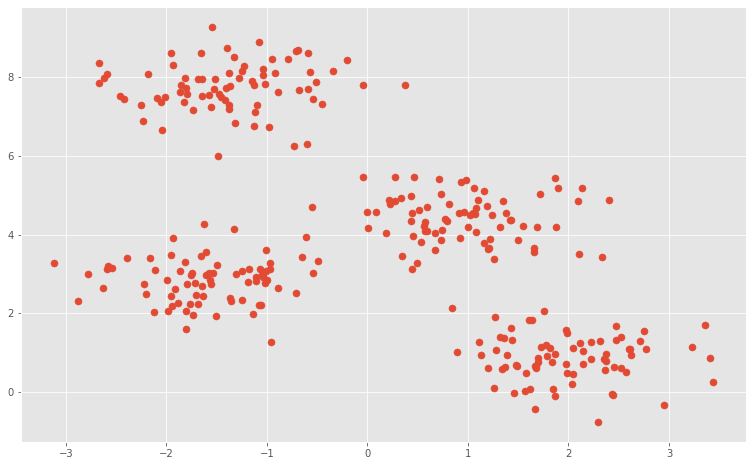

In [129]:
fig, ax = plt.subplots(figsize = (13, 8))

ax.scatter(X[:, 0], X[:, 1], s = 50);

In [130]:
kmeans = KMeans(n_clusters = 2)

In [131]:
kmeans.fit(X)

KMeans(n_clusters=2)

In [132]:
y_kmeans = kmeans.predict(X)

In [133]:
kmeans.cluster_centers_ #centroides de los clusters en coordenadas x,y

array([[-1.33465447,  7.69442683],
       [ 0.45233231,  2.68105561]])

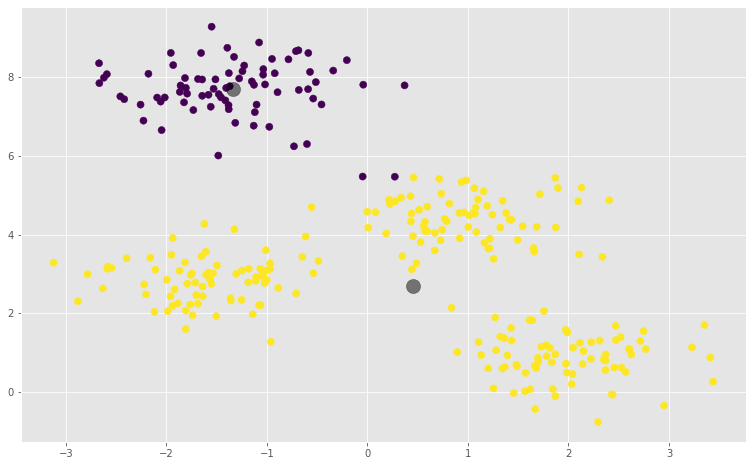

In [134]:
fig, ax = plt.subplots(figsize = (13, 8))

ax.scatter(X[:, 0], X[:, 1], c = y_kmeans, s = 50, cmap = 'viridis')

centers = kmeans.cluster_centers_
ax.scatter(centers[:, 0], centers[:, 1], c = 'k', s = 200, alpha = 0.5);

funcionamiento lento

In [143]:
#set the center randomlly
rng = np.random.RandomState(42)
centers = [0, 4] + rng.randn(4, 2)
centers

array([[ 0.49671415,  3.8617357 ],
       [ 0.64768854,  5.52302986],
       [-0.23415337,  3.76586304],
       [ 1.57921282,  4.76743473]])

In [144]:
pairwise_distances_argmin(X, centers)
#regresa el indice(cluster) al cual pertence la observacion 
#investigar bien qué hace el pairwise

array([0, 1, 3, 1, 0, 0, 2, 3, 1, 1, 2, 1, 3, 1, 0, 0, 3, 0, 2, 2, 0, 0,
       1, 2, 2, 2, 0, 1, 2, 0, 1, 1, 3, 1, 1, 1, 1, 1, 2, 0, 0, 2, 1, 3,
       2, 2, 1, 2, 1, 0, 2, 0, 1, 0, 0, 2, 1, 2, 1, 0, 1, 0, 1, 2, 2, 2,
       1, 0, 1, 2, 3, 2, 1, 2, 2, 1, 2, 3, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1,
       1, 1, 0, 0, 1, 2, 2, 0, 0, 0, 1, 2, 1, 0, 1, 0, 3, 0, 0, 3, 1, 1,
       2, 2, 0, 1, 0, 3, 1, 0, 0, 1, 2, 0, 2, 0, 0, 0, 0, 2, 0, 2, 1, 2,
       2, 0, 1, 2, 2, 1, 0, 1, 1, 2, 0, 2, 3, 2, 1, 2, 1, 1, 1, 3, 1, 1,
       0, 2, 1, 2, 0, 3, 1, 0, 0, 0, 1, 2, 2, 1, 0, 0, 0, 1, 0, 3, 2, 1,
       0, 0, 0, 2, 0, 3, 2, 2, 0, 3, 1, 0, 0, 1, 0, 2, 3, 0, 2, 2, 2, 3,
       2, 1, 0, 2, 0, 2, 0, 1, 2, 1, 3, 1, 3, 2, 2, 3, 1, 2, 2, 0, 0, 0,
       1, 0, 0, 2, 0, 2, 0, 1, 1, 3, 0, 1, 0, 0, 2, 0, 0, 2, 1, 2, 0, 1,
       0, 1, 1, 1, 1, 2, 2, 1, 3, 2, 0, 0, 2, 2, 2, 0, 0, 1, 3, 1, 2, 0,
       1, 2, 3, 1, 1, 0, 0, 2, 2, 3, 3, 0, 0, 3, 1, 1, 0, 0, 0, 0, 0, 0,
       1, 2, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 2], d

In [145]:
#dibuja puntos
def draw_points(ax, c, factor = 1):
    ax.scatter(X[:, 0], X[:, 1], c = c, cmap = 'viridis',
               s = 50 * factor, alpha = 0.3)
    
#dibuja los centroides
def draw_centers(ax, centers, factor = 1, alpha = 1.0):
    
    ax.scatter(centers[:, 0], centers[:, 1],
               c = np.arange(4), cmap = 'viridis', s = 200 * factor,
               alpha=alpha)
    ax.scatter(centers[:, 0], centers[:, 1],
               c = 'black', s = 50 * factor, alpha = alpha) 
    
def make_ax(fig, gs):
    #gs es una maya donde hay que graficar
    
    ax = fig.add_subplot(gs)
    ax.xaxis.set_major_formatter(plt.NullFormatter())
    ax.yaxis.set_major_formatter(plt.NullFormatter())
    return ax

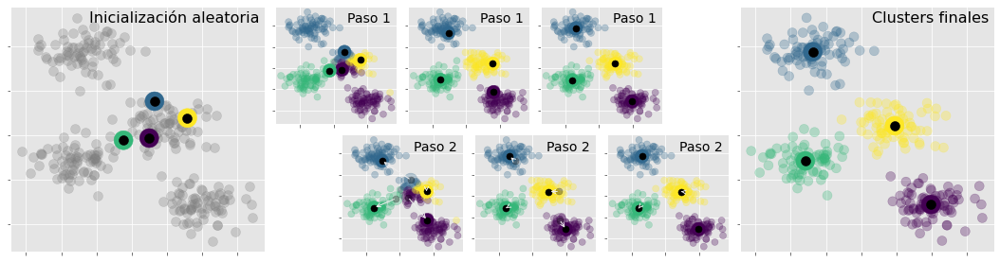

In [146]:
#creando unicamente la figura de tamaño 15x4
fig = plt.figure(figsize = (15, 4))

#creando una maya de 4rebglonesx15columnas
#en las columnas se iran insertando ejes
gs = plt.GridSpec(4, 15, left = 0.02, right = 0.98, bottom = 0.05,
                  top = 0.95, wspace = 0.2, hspace = 0.2)

#creando un eje tomando como maya todos los renglones y dela primera hasat la 4ta columna
ax0 = make_ax(fig, gs[:, :4])
#se agrega texto en la grafica
ax0.text(0.98, 0.98, "Inicialización aleatoria", transform = ax0.transAxes,
         ha = 'right', va = 'top', size = 16)
#puntos grises
draw_points(ax0, 'gray', factor = 2)
#centroides asignados de forma aleatoria
draw_centers(ax0, centers, factor = 2)

for i in range(3):
    
    #crear un eje con sliceings raros para desplazar los graficos
    ax1 = make_ax(fig, gs[:2, 4 + 2 * i:6 + 2 * i])
    ax2 = make_ax(fig, gs[2:, 5 + 2 * i:7 + 2 * i])
    
    # E-step
    #calculo de distancias por pares
    y_pred = pairwise_distances_argmin(X, centers)
    draw_points(ax1, y_pred)
    draw_centers(ax1, centers)
    
    # M-step
    #ajsute de centroides
    new_centers = np.array([X[y_pred == i].mean(0) for i in range(4)])
    draw_points(ax2, y_pred)
    draw_centers(ax2, centers, alpha=0.3)
    draw_centers(ax2, new_centers)
    for i in range(4):
        #anotate coloca flechitas
        ax2.annotate('', new_centers[i], centers[i],
                     arrowprops = dict(arrowstyle = '->', linewidth = 1))
        
    
    # Finish iteration
    centers = new_centers
    ax1.text(0.95, 0.95, "Paso 1", transform = ax1.transAxes, ha = 'right',
             va = 'top', size = 14)
    ax2.text(0.95, 0.95, "Paso 2", transform = ax2.transAxes, ha = 'right',
             va = 'top', size = 14)


# Final E-step    
y_pred = pairwise_distances_argmin(X, centers)
axf = make_ax(fig, gs[:, -4:])
draw_points(axf, y_pred, factor = 2)
draw_centers(axf, centers, factor = 2)
axf.text(0.98, 0.98, "Clusters finales", transform = axf.transAxes,
         ha = 'right', va = 'top', size = 16);

Para n_clusters = 2 el promedio de silhouette_score es : 0.5426422297358302
Para n_clusters = 3 el promedio de silhouette_score es : 0.5890390393551768
Para n_clusters = 4 el promedio de silhouette_score es : 0.6819938690643478
Para n_clusters = 5 el promedio de silhouette_score es : 0.5923875148758644
Para n_clusters = 6 el promedio de silhouette_score es : 0.49934504405927566


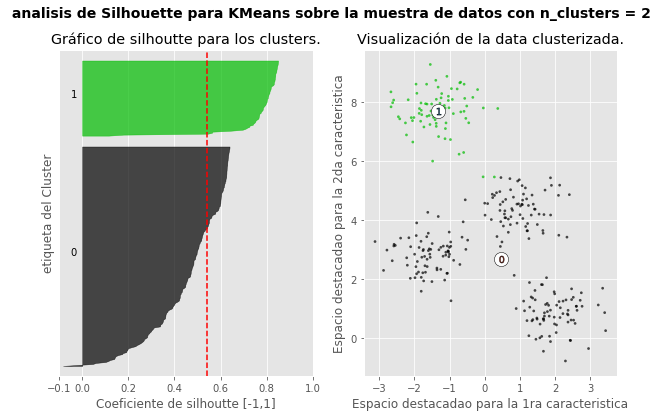

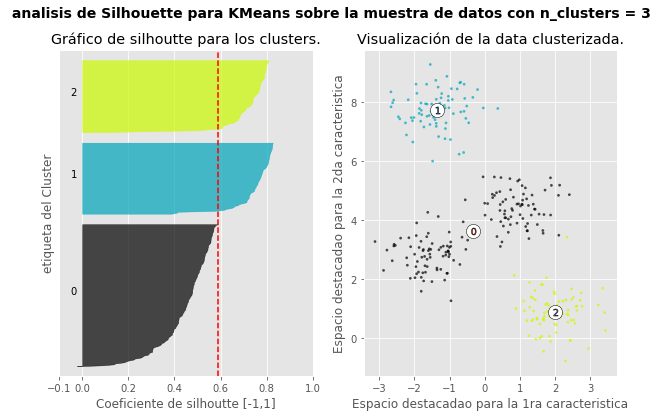

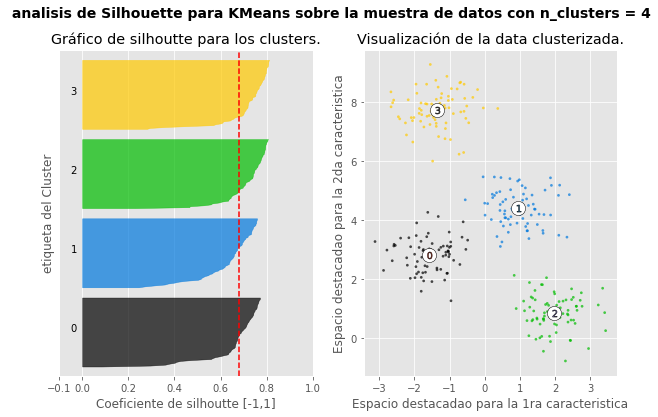

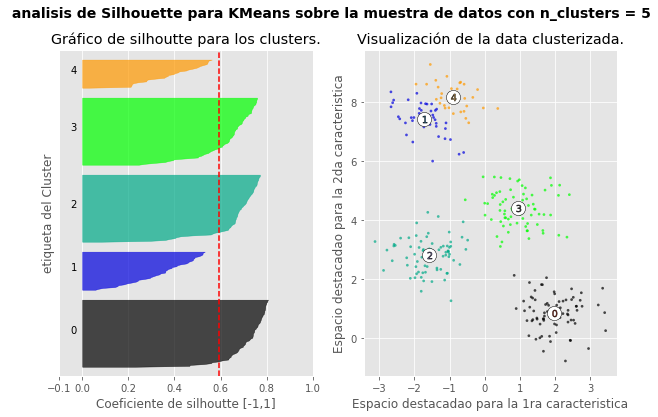

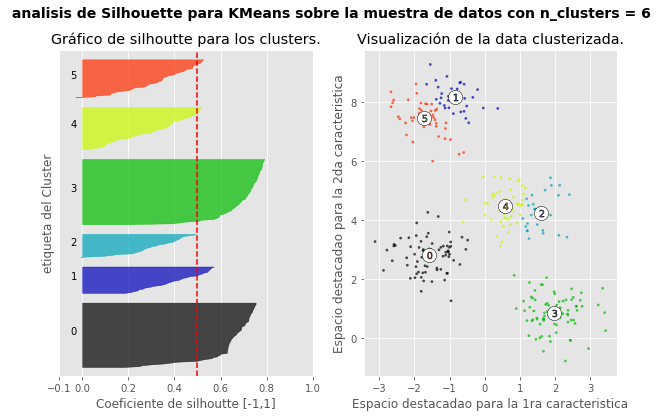

In [148]:
range_n_clusters = [2, 3, 4, 5, 6]

for n_clusters in range_n_clusters:
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (10, 6))
    
    # The 1st subplot is the silhouette plot
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters
    clusterer = KMeans(n_clusters = n_clusters, random_state = 10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    msn = "Para n_clusters = {} el promedio de silhouette_score es : {}"
    print(msn.format(n_clusters, silhouette_avg))

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
       
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        #espacio entre cuchillas
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        #colorea sobre el eje x
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor = color, edgecolor = color, alpha = 0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  

    ax1.set_title("Gráfico de silhoutte para los clusters.")
    ax1.set_xlabel("Coeficiente de silhoutte [-1,1]")
    ax1.set_ylabel("etiqueta del Cluster")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x = silhouette_avg, color = "red", linestyle = "--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker = '.', s = 30, lw = 0, alpha = 0.7,
                c = colors, edgecolor = 'k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker = 'o',
                c = "white", alpha = 1, s = 200, edgecolor = 'k')

    for i, c in enumerate(centers):
                                #marker es un format
        ax2.scatter(c[0], c[1], marker = '$%d$' % i, alpha = 1,
                    s = 50, edgecolor = 'k')

    ax2.set_title("Visualización de la data clusterizada.")
    ax2.set_xlabel("Espacio destacadao para la 1ra caracteristica")
    ax2.set_ylabel("Espacio destacadao para la 2da caracteristica")

    plt.suptitle((" analisis de Silhouette para KMeans sobre la muestra de datos "
                  "con n_clusters = {}".format(n_clusters)),
                 fontsize = 14, fontweight = 'bold');

# Caso de uso Pokemon

Data set tomado de [pokemon](https://www.kaggle.com/code/jbernardo/pokmeans-kmeans-clustering-in-pokedex/data)

In [224]:
pokemon = pd.read_csv('Pokemon.csv')

In [225]:
pokemon.head()

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
0,1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,1,False
1,2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,1,False
2,3,Venusaur,Grass,Poison,525,80,82,83,100,100,80,1,False
3,3,VenusaurMega Venusaur,Grass,Poison,625,80,100,123,122,120,80,1,False
4,4,Charmander,Fire,NaN,309,39,52,43,60,50,65,1,False


para fines de nuestro ejercicio eliminaremos la columna que dice cluster porque nosotros haremos el ejercicio de clusterizar desde cero

    #: ID for each pokemon
    Name: Name of each pokemon
    Type 1: Each pokemon has a type, this determines weakness/resistance to attacks
    Type 2: Some pokemon are dual type and have 2
    Total: sum of all stats that come after this, a general guide to how strong a pokemon is
    HP: hit points, or health, defines how much damage a pokemon can withstand before fainting
    Attack: the base modifier for normal attacks (eg. Scratch, Punch)
    Defense: the base damage resistance against normal attacks
    SP Atk: special attack, the base modifier for special attacks (e.g. fire blast, bubble beam)
    SP Def: the base damage resistance against special attacks
    Speed: determines which pokemon attacks first each round


In [226]:
pokemon.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 800 entries, 0 to 799
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   #           800 non-null    int64 
 1   Name        800 non-null    object
 2   Type 1      800 non-null    object
 3   Type 2      414 non-null    object
 4   Total       800 non-null    int64 
 5   HP          800 non-null    int64 
 6   Attack      800 non-null    int64 
 7   Defense     800 non-null    int64 
 8   Sp. Atk     800 non-null    int64 
 9   Sp. Def     800 non-null    int64 
 10  Speed       800 non-null    int64 
 11  Generation  800 non-null    int64 
 12  Legendary   800 non-null    bool  
dtypes: bool(1), int64(9), object(3)
memory usage: 75.9+ KB


In [227]:
pokemon.head()

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
0,1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,1,False
1,2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,1,False
2,3,Venusaur,Grass,Poison,525,80,82,83,100,100,80,1,False
3,3,VenusaurMega Venusaur,Grass,Poison,625,80,100,123,122,120,80,1,False
4,4,Charmander,Fire,NaN,309,39,52,43,60,50,65,1,False


In [228]:
for i in pokemon.columns:
    print(f'para la variable "{i}" el conteo de valores distintos es\n',pokemon[i].value_counts())

para la variable "#" el conteo de valores distintos es
 479    6
386    4
710    4
711    4
646    3
      ..
250    1
251    1
252    1
253    1
721    1
Name: #, Length: 721, dtype: int64
para la variable "Name" el conteo de valores distintos es
 Masquerain    1
Rotom         1
Tepig         1
Torchic       1
Metapod       1
             ..
Kabuto        1
Bronzong      1
Shelgon       1
Pansage       1
Haxorus       1
Name: Name, Length: 800, dtype: int64
para la variable "Type 1" el conteo de valores distintos es
 Water       112
Normal       98
Grass        70
Bug          69
Psychic      57
Fire         52
Electric     44
Rock         44
Ground       32
Ghost        32
Dragon       32
Dark         31
Poison       28
Steel        27
Fighting     27
Ice          24
Fairy        17
Flying        4
Name: Type 1, dtype: int64
para la variable "Type 2" el conteo de valores distintos es
 Flying      97
Ground      35
Poison      34
Psychic     33
Fighting    26
Grass       25
Fairy     

De lo anterior podemos deducir que las variables numéricas que nos ayudarán a clasificar a nuestros pokemones son 
   - Total 
   - HP 
   - Attack 
   - Defense 
   - Sp. Atk 
   - Sp. Def 
   - Speed

In [229]:
feature_cols = ['Total', 'HP', 'Attack', 'Defense',
       'Sp. Atk', 'Sp. Def', 'Speed']

In [230]:
pok = pokemon[feature_cols]

antes de continuar y para obtener un mayor performance del algoritmo estandarizaremos el dataFrame

In [231]:
ss = StandardScaler(with_mean=True,with_std=True).fit(pok)
pok_std = ss.transform(pok) 

In [232]:
pok_df_std = pd.DataFrame(pok_std, columns = feature_cols)

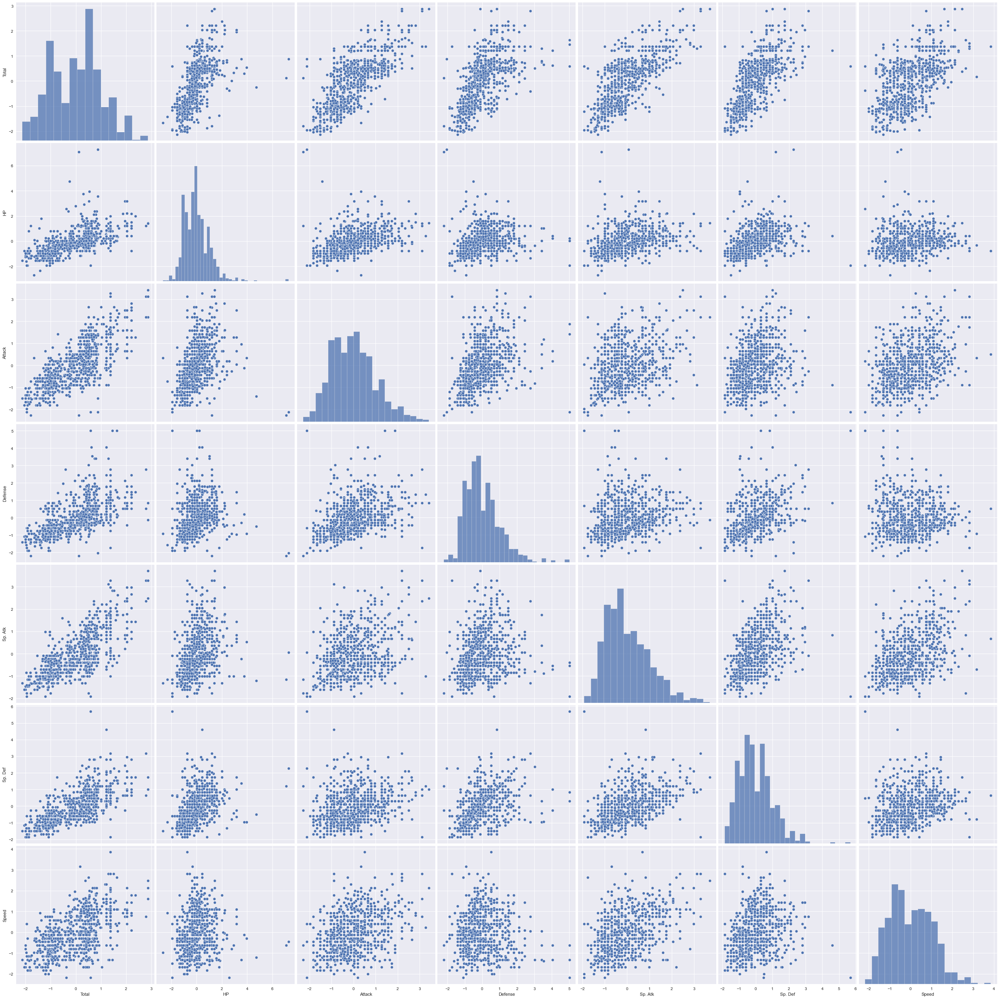

In [233]:
sns.pairplot(pok_df_std,size=5);

a simple vista no es tan facil identificar el numero de cluster que tendríamos que usar para clasificar a nuestros pokemones

,k,inertia
0,1,5600.000000
1,2,3515.487951
2,3,3037.128832
3,4,2693.653352
4,5,2454.978526
5,6,2321.847890
6,7,2182.378071
7,8,2067.012543
8,9,1961.864456
9,10,1870.288099


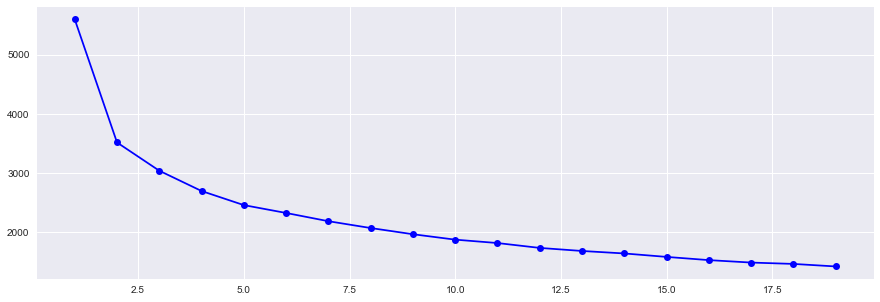

In [234]:
intertias = []
for k in list(range(1,20)):
    kmeans = KMeans(n_clusters = k).fit(pok_df_std)
    intertias.append([k, kmeans.inertia_])
    
intertias_df = pd.DataFrame(intertias, columns = ['k', 'inertia'])
display(intertias_df)
plt.figure(figsize=(15,5))
plt.plot(intertias_df['k'].values,intertias_df['inertia'].values,'b-o')
plt.show()

Dado el grafico de codo y brazo, podemos ver que el numero de clusters óptimo está entre 2 y 4 ya que ahí es donde se presenta un salto más grnade de inercias

Para n_clusters = 2 el promedio de silhouette_score es : 0.3256451948776502
Para n_clusters = 3 el promedio de silhouette_score es : 0.25054609244455994
Para n_clusters = 4 el promedio de silhouette_score es : 0.2388822623359874
Para n_clusters = 5 el promedio de silhouette_score es : 0.24440211284228652
Para n_clusters = 6 el promedio de silhouette_score es : 0.22692813083570954


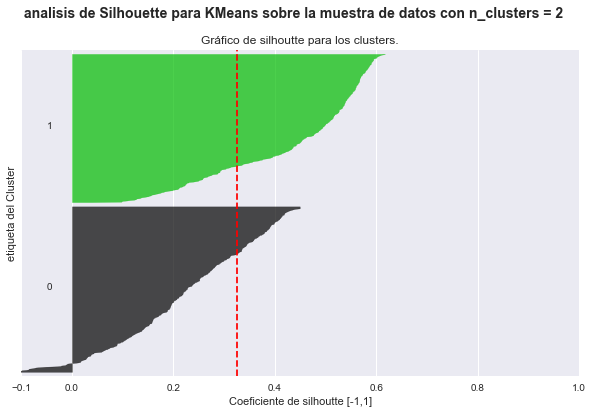

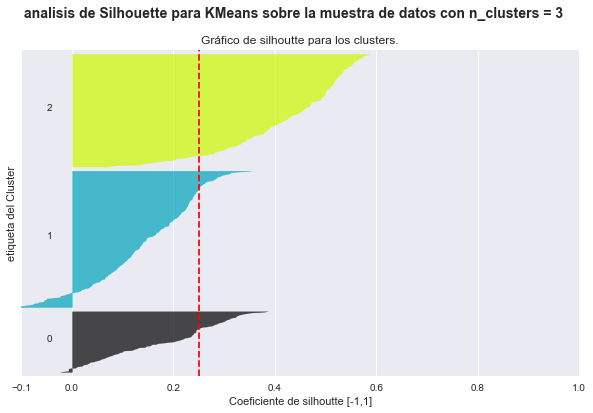

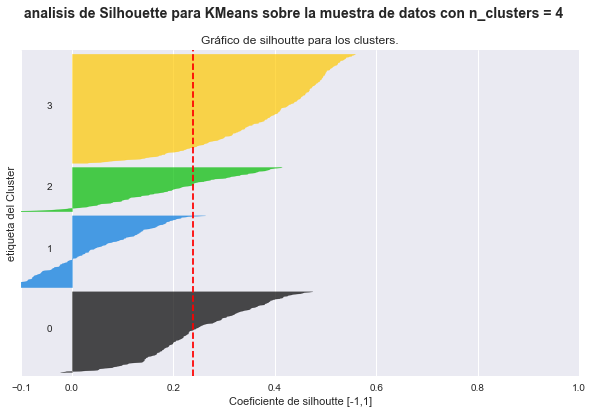

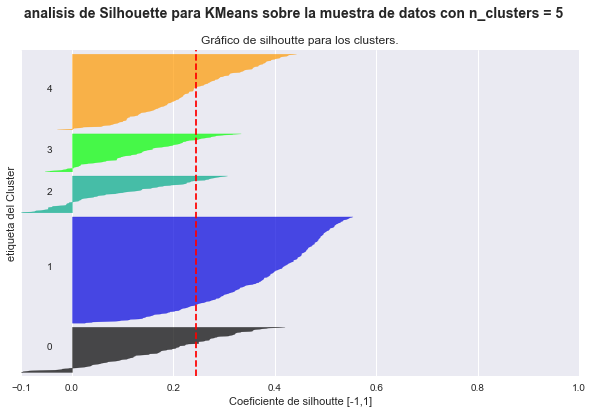

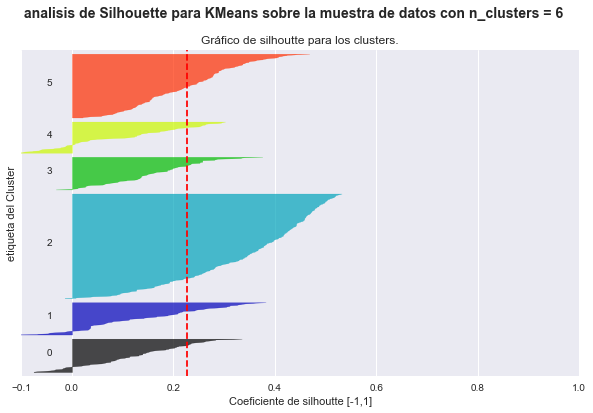

In [235]:
range_n_clusters = [2, 3, 4, 5, 6]

for n_clusters in range_n_clusters:
    
    fig, (ax1) = plt.subplots(1, 1, figsize = (10, 6))
    
    # The 1st subplot is the silhouette plot
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(pok_df_std) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters
    clusterer = KMeans(n_clusters = n_clusters, random_state = 10)
    cluster_labels = clusterer.fit_predict(pok_df_std)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(pok_df_std, cluster_labels)
    msn = "Para n_clusters = {} el promedio de silhouette_score es : {}"
    print(msn.format(n_clusters, silhouette_avg))

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(pok_df_std, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
       
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        #espacio entre cuchillas
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        #colorea sobre el eje x
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor = color, edgecolor = color, alpha = 0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  

    ax1.set_title("Gráfico de silhoutte para los clusters.")
    ax1.set_xlabel("Coeficiente de silhoutte [-1,1]")
    ax1.set_ylabel("etiqueta del Cluster")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x = silhouette_avg, color = "red", linestyle = "--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    plt.suptitle((" analisis de Silhouette para KMeans sobre la muestra de datos "
                  "con n_clusters = {}".format(n_clusters)),
                 fontsize = 14, fontweight = 'bold');

De lo anterior, podemo observar que en todos los clusters siempre hay individuos que no se parecen a los de su cluster, sin embargo el que tiene el silhoutte más alto ese cuando k = 2, esto nos hace pensar que quizá los grupos los esté formanto en relación a si el pokemon es legendario o no y no tanto a su tipo 

In [236]:
pok_df_std

,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed
0,-0.976765,-0.950626,-0.924906,-0.797154,-0.239130,-0.248189,-0.801503
1,-0.251088,-0.362822,-0.524130,-0.347917,0.219560,0.291156,-0.285015
2,0.749845,0.420917,0.092448,0.293849,0.831146,1.010283,0.403635
3,1.583957,0.420917,0.647369,1.577381,1.503891,1.729409,0.403635
4,-1.051836,-1.185748,-0.832419,-0.989683,-0.392027,-0.787533,-0.112853
...,...,...,...,...,...,...,...
795,1.375429,-0.754692,0.647369,2.443765,0.831146,2.808099,-0.629341
796,2.209541,-0.754692,2.497104,1.160233,2.665905,1.369846,1.436611
797,1.375429,0.420917,0.955658,-0.444182,2.360112,2.088973,0.059310
798,2.042718,0.420917,2.497104,-0.444182,2.971699,2.088973,0.403635


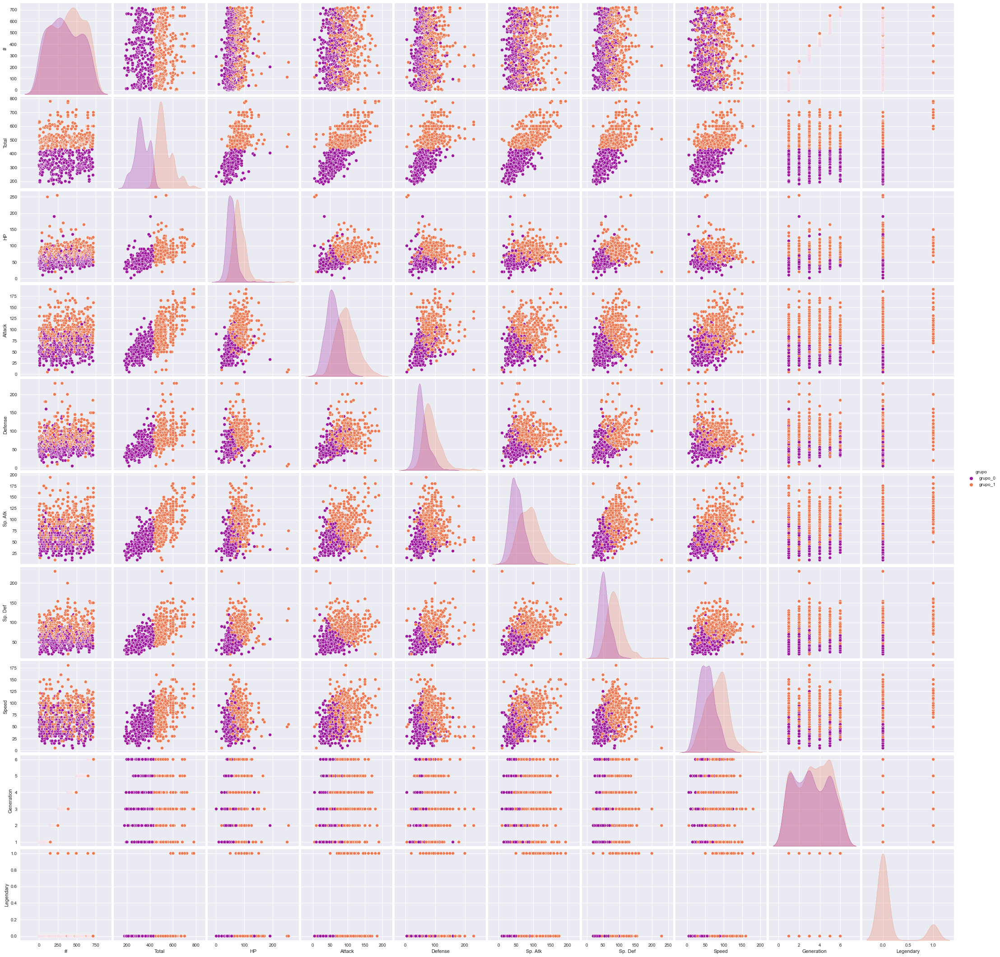

In [237]:
kmeans = KMeans(n_clusters = 2).fit(pok_df_std)
pokemon['grupo'] = kmeans.predict(pok_df_std)
pokemon['grupo'] = pokemon['grupo'].apply(lambda row: 'grupo_'+str(row))

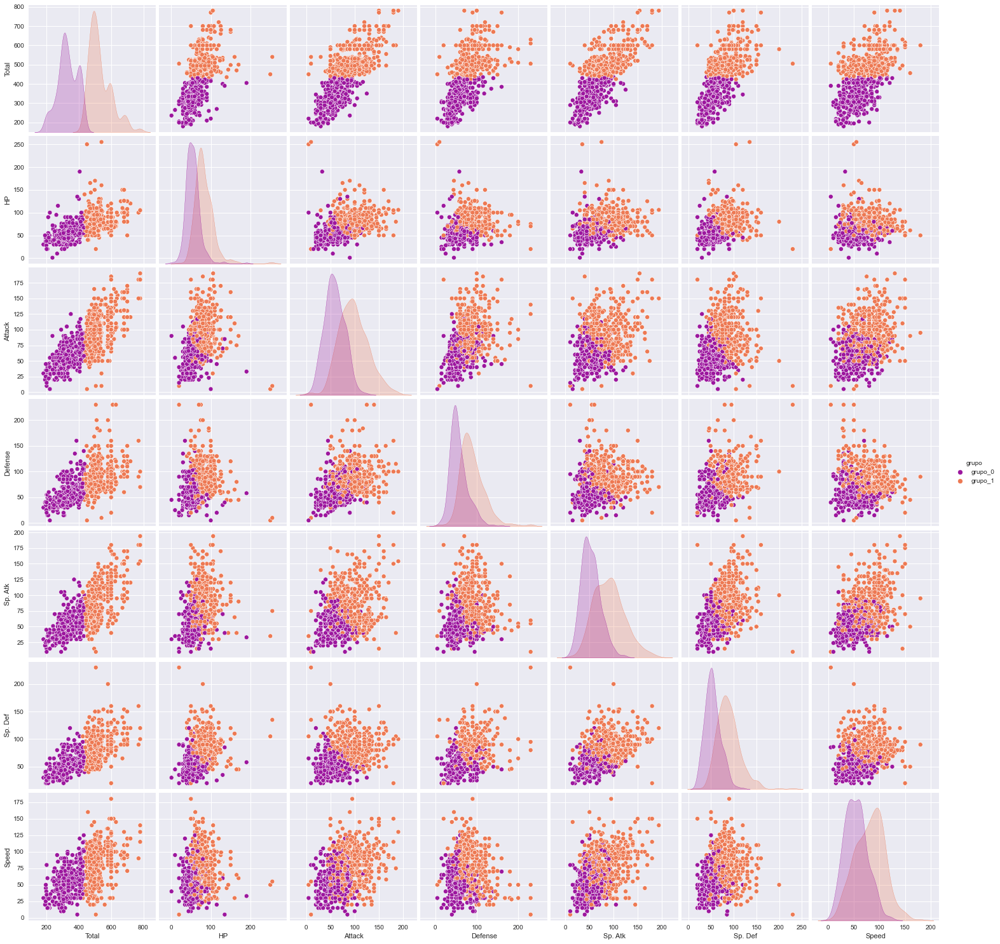

In [242]:
sns.pairplot(pokemon[feature_cols + ['grupo']],
             hue = 'grupo',
             size = 3,
             palette = "plasma");

In [246]:
pokemon.groupby(['grupo','Legendary']).count()

#  Name  Type 1  Type 2  Total   HP  Attack  Defense  \
grupo   Legendary                                                           
grupo_0 False      378   378     378     169    378  378     378      378   
grupo_1 False      357   357     357     205    357  357     357      357   
        True        65    65      65      40     65   65      65       65   

                   Sp. Atk  Sp. Def  Speed  Generation  
grupo   Legendary                                       
grupo_0 False          378      378    378         378  
grupo_1 False          357      357    357         357  
        True            65       65     65          65

De la tabla anterior lo que podemos decir es que si un pokemon cae en el grupo cero es muy probable que no sea un pokemon legendario, del grupo 1 no podemos hacer muchas aseveraciones

## mejorando el performance con Escalamiento Multidimensional

In [253]:
pokemon_vectors = manifold.MDS(n_components=2,
                               #dissimilarity='precomputed',
                               random_state = 2022)\
                     .fit_transform(pok_df_std)

In [254]:
cols = ['x1','x2']
map_pokemon = pd.DataFrame(pokemon_vectors, columns=cols)

In [255]:
map_pokemon['name'] = pokemon['Name']

In [257]:
map_pokemon

,x1,x2,name
0,1.989942,0.140437,Bulbasaur
1,0.532009,0.071112,Ivysaur
2,-1.540697,0.090489,Venusaur
3,-3.294018,-0.668893,VenusaurMega Venusaur
4,2.130049,0.807122,Charmander
...,...,...,...
795,-3.156941,-2.937998,Diancie
796,-4.838332,1.366198,DiancieMega Diancie
797,-3.605093,0.721610,HoopaHoopa Confined
798,-4.923950,1.105589,HoopaHoopa Unbound


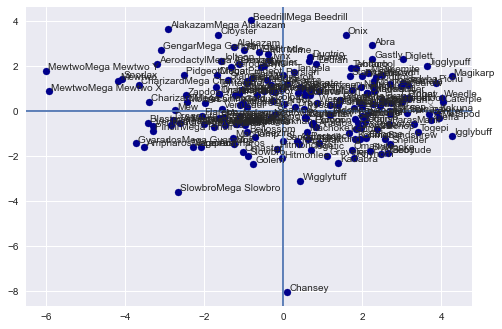

In [266]:
scatterPlot(plt, #objeto de grafica
            map_pokemon[:200], #dataframe a graficar
            'x1', # nuevo eje coordenado 1
            'x2', #nuevo coordenado 2
            'darkblue', #color de los puntos 
            label = 'name')

El escalamiento multidimensional tampoco parecer ayudarnos mucho a logar una separación de pokemones

## Recurriendo a PCA para un mejor mapeo de los datos

In [272]:
k = 7
pca_pokemon_cols = ['pc'+str(i+1) for i in range(0,k)]
pca_pokemon_model = PCA(n_components = k).fit(pok_df_std)

trans_pokemon = pd.DataFrame(data = pca_pokemon_model.transform(pok_df_std),
                              columns=pca_pokemon_cols)

pca_pokemon_all = pd.concat([pokemon,trans_pokemon],axis=1)
pca_pokemon_all[:5]

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,...,Generation,Legendary,grupo,pc1,pc2,pc3,pc4,pc5,pc6,pc7
0,1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,...,1,False,grupo_0,-1.840088,-0.025494,0.665107,0.169980,-0.402885,-0.299509,-5.270530e-16
1,2,Ivysaur,Grass,Poison,405,60,62,63,80,80,...,1,False,grupo_0,-0.443543,-0.050760,0.668752,0.264308,-0.225523,-0.193394,-1.189096e-16
2,3,Venusaur,Grass,Poison,525,80,82,83,100,100,...,1,False,grupo_1,1.480309,-0.058428,0.627574,0.339387,-0.002228,-0.070459,4.376468e-16
3,3,VenusaurMega Venusaur,Grass,Poison,625,80,100,123,122,120,...,1,False,grupo_1,3.060557,0.711939,0.998631,-0.183487,-0.311808,0.082155,8.262249e-16
4,4,Charmander,Fire,NaN,309,39,52,43,60,50,...,1,False,grupo_0,-2.045946,-0.711499,0.407573,-0.283886,-0.167915,-0.065974,-4.943830e-16


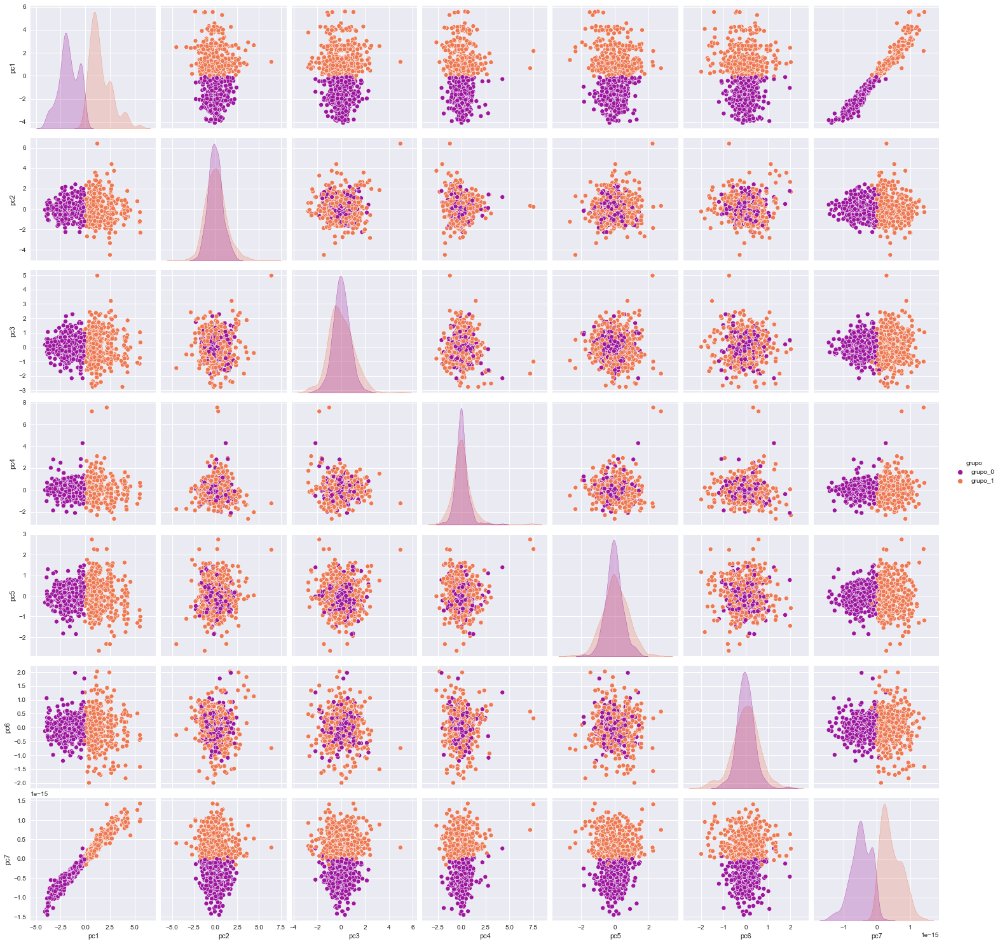

In [274]:
sns.pairplot(pca_pokemon_all[pca_pokemon_cols + ['grupo']],
             hue='grupo',
             size=3,
             palette="plasma");

los colores que vemos aquí son del k_means pero sin pca, solo con la datra estandarizada y de aquí, podemos cobservar que la componente 1 y 7 separan muy bien en dos grupos


Ahora realizaremos k.means pero las variable sde insumo deran las componentes principales

,k,inertia_pc
0,1,5600.000000
1,2,3515.487951
2,3,3037.128832
3,4,2693.832355
4,5,2454.978526
5,6,2310.063396
6,7,2188.177622
7,8,2073.498826
8,9,1966.289225
9,10,1877.698330


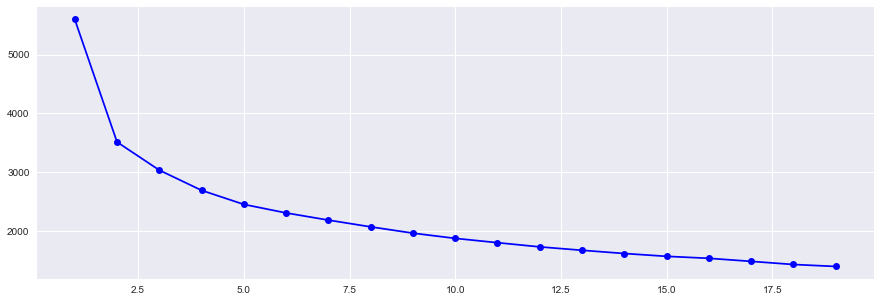

In [279]:
intertias_pc = []
for k in list(range(1,20)):
    kmeans = KMeans(n_clusters = k).fit(pca_pokemon_all[pca_pokemon_cols])
    intertias_pc.append([k, kmeans.inertia_])
    
intertias_df_pca = pd.DataFrame(intertias_pc, columns = ['k', 'inertia_pc'])
display(intertias_df_pca)
plt.figure(figsize=(15,5))
plt.plot(intertias_df_pca['k'].values,
         intertias_df_pca['inertia_pc'].values,'b-o')
plt.show()

Podemos observar que las incercias son muy parecidas a las del modelo con las variables estandarizadas

Para n_clusters = 2 el promedio de silhouette_score es : 0.3256451948777058
Para n_clusters = 3 el promedio de silhouette_score es : 0.25054609244477605
Para n_clusters = 4 el promedio de silhouette_score es : 0.23888226233633955
Para n_clusters = 5 el promedio de silhouette_score es : 0.24440211284262348
Para n_clusters = 6 el promedio de silhouette_score es : 0.2269281308362215


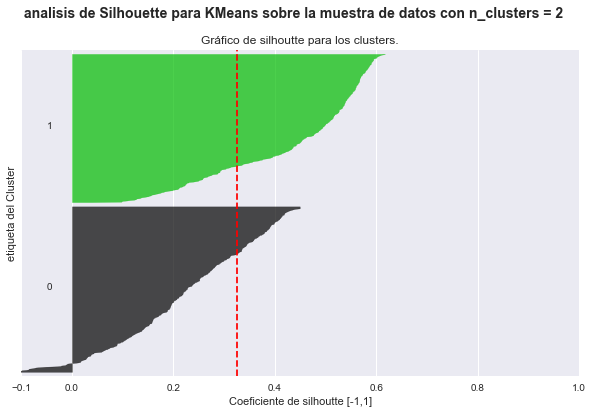

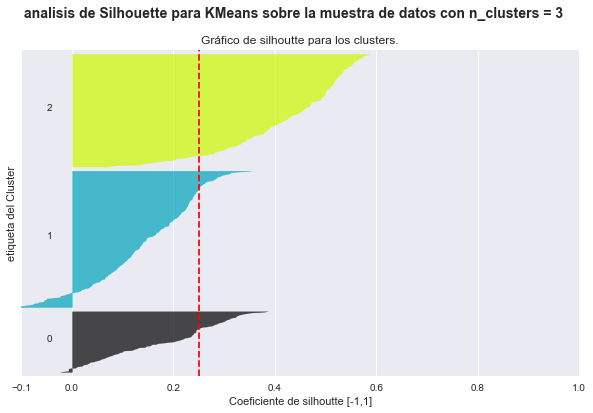

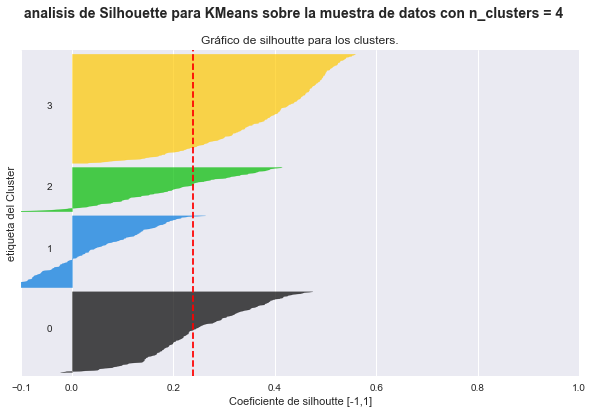

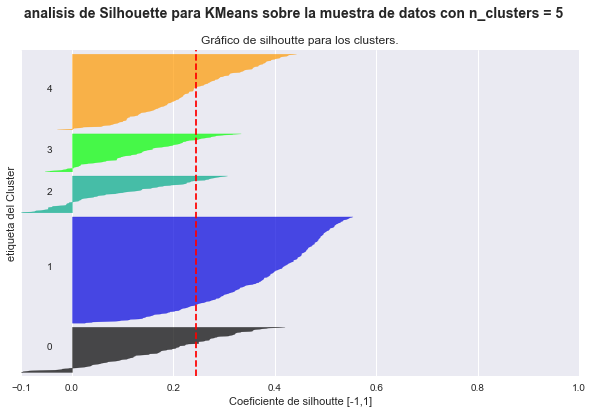

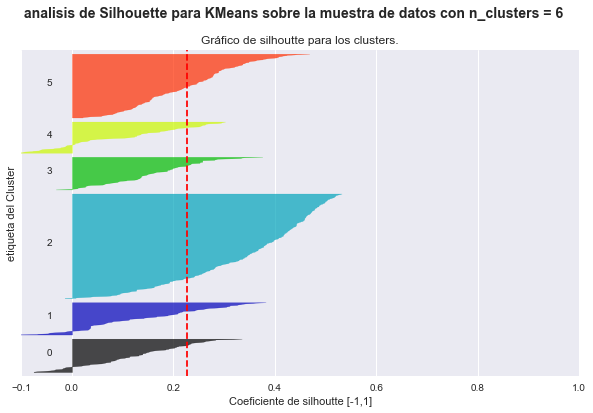

In [285]:
range_n_clusters = [2, 3, 4, 5, 6]

for n_clusters in range_n_clusters:
    
    fig, (ax1) = plt.subplots(1, 1, figsize = (10, 6))
    
    # The 1st subplot is the silhouette plot
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(pca_pokemon_all) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters
    clusterer = KMeans(n_clusters = n_clusters, random_state = 10)
    cluster_labels = clusterer.fit_predict(pca_pokemon_all[pca_pokemon_cols])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(pca_pokemon_all[pca_pokemon_cols], 
                                      cluster_labels)
    msn = "Para n_clusters = {} el promedio de silhouette_score es : {}"
    print(msn.format(n_clusters, silhouette_avg))

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(pca_pokemon_all[pca_pokemon_cols], 
                                                  cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
       
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        #espacio entre cuchillas
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        #colorea sobre el eje x
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor = color, edgecolor = color, alpha = 0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  

    ax1.set_title("Gráfico de silhoutte para los clusters.")
    ax1.set_xlabel("Coeficiente de silhoutte [-1,1]")
    ax1.set_ylabel("etiqueta del Cluster")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x = silhouette_avg, color = "red", linestyle = "--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    plt.suptitle((" analisis de Silhouette para KMeans sobre la muestra de datos "
                  "con n_clusters = {}".format(n_clusters)),
                 fontsize = 14, fontweight = 'bold');

Podemos observar que seguimos con el mismo problema de que hay pokemones que no se parecen a su cluster

In [289]:
kmeans = KMeans(n_clusters = 2).fit(pca_pokemon_all[pca_pokemon_cols])
pca_pokemon_all['grupo_pca'] = kmeans.predict(pca_pokemon_all[pca_pokemon_cols])
pca_pokemon_all['grupo_pca'] = pokemon['grupo_pca'].apply(lambda row: 'grupo_'+str(row))

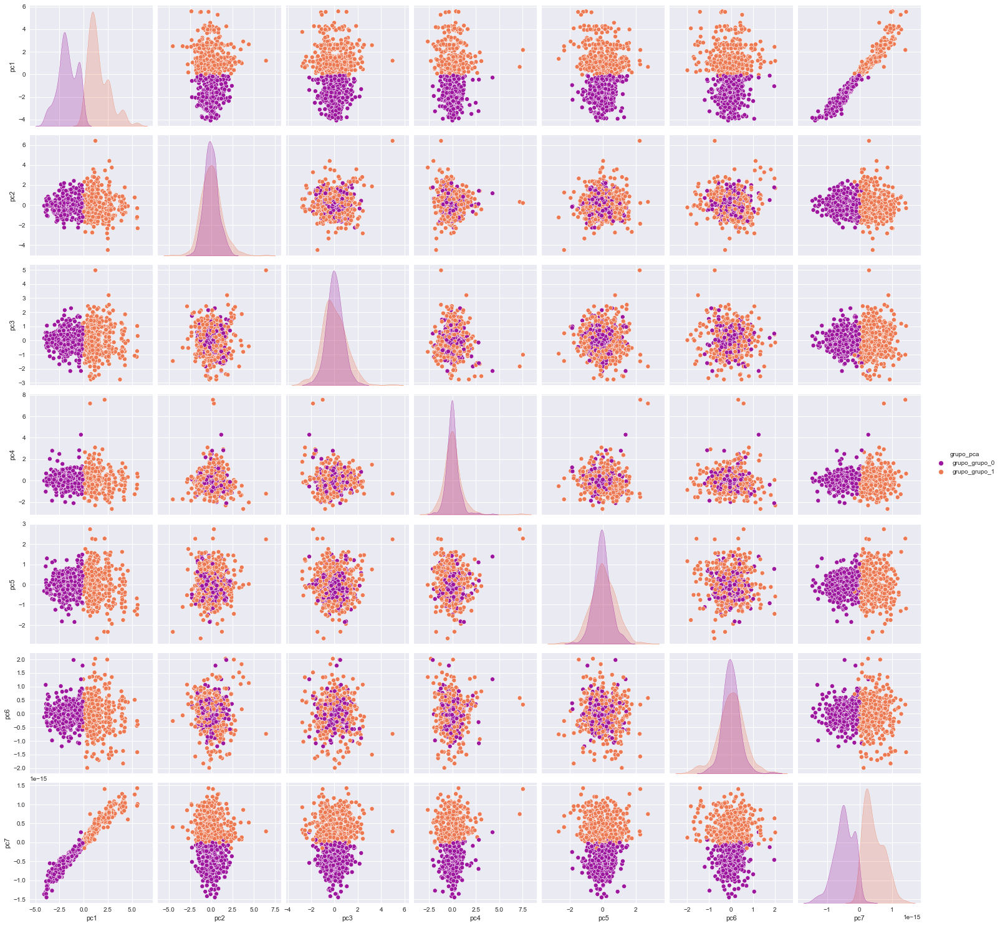

In [290]:
sns.pairplot(pca_pokemon_all[pca_pokemon_cols + ['grupo_pca']],
             hue = 'grupo_pca',
             size = 3,
             palette = "plasma");

In [292]:
pca_pokemon_all.groupby(['grupo_pca','Legendary']).count()

#  Name  Type 1  Type 2  Total   HP  Attack  \
grupo_pca     Legendary                                                  
grupo_grupo_0 False      378   378     378     169    378  378     378   
grupo_grupo_1 False      357   357     357     205    357  357     357   
              True        65    65      65      40     65   65      65   

                         Defense  Sp. Atk  Sp. Def  Speed  Generation  grupo  \
grupo_pca     Legendary                                                        
grupo_grupo_0 False          378      378      378    378         378    378   
grupo_grupo_1 False          357      357      357    357         357    357   
              True            65       65       65     65          65     65   

                         pc1  pc2  pc3  pc4  pc5  pc6  pc7  
grupo_pca     Legendary                                     
grupo_grupo_0 False      378  378  378  378  378  378  378  
grupo_grupo_1 False      357  357  357  357  357  357  357  
              True        65   65   65   65   65   65   65

Los resultados ontenidos con las variables del PCA son casi identicos a los que sólo se les aplicó la estándarización,  la unica diferencia que podemos notar es que, la componente 1 y 7 separan muy bien en dos grupos